# Imports

In [1]:
import os
from pathlib import Path
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision.transforms as transforms

from sklearn.metrics import (
    accuracy_score,
    f1_score,
    classification_report,
    confusion_matrix
)

from tqdm import tqdm
from gc import collect
import timm


In [ ]:
"""from google.colab import drive
drive.mount('/content/drive')"""


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Globals

In [2]:
train_path = "./dffd_small/train/"
test_path = "./dffd_small/test/"
validation_path = "./dffd_small/validation/"

In [3]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


In [4]:
batch_size = 32
loss_ce = nn.CrossEntropyLoss()
MEAN = [0.485, 0.456, 0.406]
STD = [0.229, 0.224, 0.225]

# Utils

Utils for fsgm attack

In [33]:
def pgd_attack(model, images, labels, epsilon, alpha, steps, mean, std):
    # 1. Denormalizza le immagini
    mean = torch.tensor(mean).view(1, -1, 1, 1).to(images.device)
    std = torch.tensor(std).view(1, -1, 1, 1).to(images.device)
    images_denorm = images * std + mean

    adv_images = images_denorm.clone().detach()

    for _ in range(steps):
        adv_images.requires_grad = True
        # Rinormalizza temporaneamente per il modello
        outputs = model((adv_images - mean) / std)
        loss = F.cross_entropy(outputs, labels)
        grad = torch.autograd.grad(loss, adv_images, retain_graph=False)[0]

        adv_images = adv_images + alpha * grad.sign()
        delta = torch.clamp(adv_images - images_denorm, min=-epsilon, max=epsilon)
        adv_images = torch.clamp(images_denorm + delta, min=0, max=1).detach()

    # 3. Rinormalizza per il modello
    adv_images = (adv_images - mean) / std
    return adv_images



In [29]:

def deepfool_attack(model, image, mean, std, num_classes=2, overshoot=0.02, max_iter=50):
    device = image.device
    mean = torch.tensor(mean).view(1, -1, 1, 1).to(device)
    std = torch.tensor(std).view(1, -1, 1, 1).to(device)

    # 1. Denormalizza l'immagine
    image_denorm = image * std + mean
    pert_image = image_denorm.clone().detach()
    r_tot = torch.zeros_like(image).to(device)

    loop_i = 0
    with torch.no_grad():
        label = model(image).argmax(dim=1).item()

    while loop_i < max_iter:
        pert_image = pert_image.detach().requires_grad_()
        outputs = model((pert_image - mean) / std)
        fs = outputs.flatten()

        grad_orig = torch.autograd.grad(fs[label], pert_image, retain_graph=True)[0]
        min_dist = float('inf')
        w = None

        for k in range(num_classes):
            if k == label:
                continue
            grad_k = torch.autograd.grad(fs[k], pert_image, retain_graph=True)[0]
            w_k = grad_k - grad_orig
            f_k = (fs[k] - fs[label]).item()
            dist = abs(f_k) / (w_k.norm() + 1e-8)

            if dist < min_dist:
                min_dist = dist
                w = w_k

        ri = (min_dist + 1e-4) * w / (w.norm() + 1e-8)
        r_tot = r_tot + ri
        pert_image = image_denorm + (1 + overshoot) * r_tot

        # Verifica se la classe è cambiata
        with torch.no_grad():
            new_label = model((pert_image - mean) / std).argmax(dim=1).item()
        if new_label != label:
            break

        loop_i += 1

    # 3. Clampa e rinormalizza
    pert_image = torch.clamp(pert_image, 0, 1)
    adv_norm = (pert_image - mean) / std
    return adv_norm


In [30]:

def i_fgsm_attack(model, images, labels, epsilon, alpha, iters, mean, std):
    # 1. Denormalizza
    mean = torch.tensor(mean).view(1, -1, 1, 1).to(images.device)
    std = torch.tensor(std).view(1, -1, 1, 1).to(images.device)
    x_denorm = images * std + mean

    # 2. Inizializza x_adv con immagine originale (denormalizzata)
    x_adv = x_denorm.clone().detach()

    for _ in range(iters):
        x_adv.requires_grad = True

        # Rinormalizza per il forward
        x_input = (x_adv - mean) / std
        outputs = model(x_input)
        loss = F.cross_entropy(outputs, labels)

        model.zero_grad()
        loss.backward()

        # Calcolo gradiente e aggiornamento
        grad = x_adv.grad.data
        x_adv = x_adv + alpha * grad.sign()
        x_adv = torch.clamp(x_adv, 0, 1).detach()  # rimane nel dominio [0,1]

    # 3. Rinormalizza il risultato finale
    x_adv_norm = (x_adv - mean) / std
    return x_adv_norm


In [34]:
def fgsm_attack(images, epsilon, grad, mean, std):
    # 1. Denormalizza le immagini
    mean = torch.tensor(mean).view(1, -1, 1, 1).to(images.device)
    std = torch.tensor(std).view(1, -1, 1, 1).to(images.device)
    images_denorm = images * std + mean

    # 2. Applica FGSM nel dominio reale [0,1]
    perturbed = images_denorm + epsilon * grad.sign()
    perturbed = torch.clamp(perturbed, 0, 1)

    # 3. Rinormalizza per il modello
    perturbed_norm = (perturbed - mean) / std
    return perturbed_norm

def denormalize(tensor, mean, std, device="cpu"):

    if isinstance(mean, list):
        mean = torch.tensor(mean).to(device)
    if isinstance(std, list):
        std = torch.tensor(std).to(device)
    return tensor * std.view(1, -1, 1, 1) + mean.view(1, -1, 1, 1)


def normalize_batch(batch):
    transform = transforms.Normalize(mean=MEAN, std=STD)
    return torch.stack([transform(img) for img in batch])

def clamp_normed(tensor, mean, std):
    mean = torch.tensor(mean).view(1, -1, 1, 1).to(tensor.device)
    std = torch.tensor(std).view(1, -1, 1, 1).to(tensor.device)
    # Calculate min and max normalized pixel values corresponding to [0,1] raw
    min_val = (0 - mean) / std
    max_val = (1 - mean) / std
    return torch.max(torch.min(tensor, max_val), min_val)

In [35]:
def evaluate_fgsm(model, dataloader, device, epsilon=0.01, visualize=False, num_visualize=5):
    model.eval()
    model.to(device)

    correct_adv = 0
    total_samples = 0

    all_labels = []
    all_preds_adv = []

    for batch in tqdm(dataloader):
        images, labels = batch["image"].to(device), batch["label"].to(device)
        images.requires_grad = True

        model.zero_grad()
        # Forward pass on clean images
        outputs = model(images)
        loss = F.cross_entropy(outputs, labels)

        # Zero grad and backward pass

        loss.backward()

        # Get gradients
        image_grad = images.grad.data

        adv_images = fgsm_attack(images, epsilon, image_grad, MEAN, STD, )

        # Forward pass on adversarial examples
        with torch.no_grad():
            adv_outputs = model(adv_images)
            adv_preds = adv_outputs.argmax(dim=1)

        # Accuracy
        correct_adv += (adv_preds == labels).sum().item()
        total_samples += labels.size(0)

        # Save predictions and labels for reporting
        all_labels.extend(labels.cpu().numpy())
        all_preds_adv.extend(adv_preds.cpu().numpy())

        if visualize and num_visualize > 0:
            adv_visual = denormalize(adv_images, MEAN, STD, device).detach()
            images_visual = denormalize(images, MEAN, STD, device).detach()
            for i in range(min(num_visualize, images.size(0))):
                plt.figure(figsize=(10, 3))

                orig = images_visual[i].detach().cpu().permute(1, 2, 0).numpy()
                adv = adv_visual[i].detach().cpu().permute(1, 2, 0).numpy()
                diff = np.clip((adv - orig) * 10, 0, 1)

                plt.subplot(1, 3, 1)
                plt.title(f"Original: {labels[i].item()}")
                plt.imshow(orig.clip(0, 1))
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.title(f"Adv (ε={epsilon})")
                plt.imshow(adv.clip(0, 1))
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.title("Difference")
                plt.imshow(diff)
                plt.axis('off')

                plt.show()

                num_visualize -= 1
                if num_visualize == 0:
                    break

    accuracy_adv = 100.0 * correct_adv / total_samples if total_samples > 0 else 0.0

    print(f"\nClassification Report on Adversarial Data (epsilon = {epsilon}):")
    print(classification_report(all_labels, all_preds_adv, digits=4))

    print("\nConfusion Matrix on Adversarial Data:")
    print(confusion_matrix(all_labels, all_preds_adv))

    return accuracy_adv


In [ ]:

def evaluate_pgd(model, dataloader, device, epsilon=0.03, alpha=0.005, steps=10):
    model.eval()
    model.to(device)

    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    for batch in tqdm(dataloader):
        images, labels = batch["image"].to(device), batch["label"].to(device)
        adv_images = pgd_attack(model, images, labels, epsilon, alpha, steps, MEAN, STD)


        with torch.no_grad():
            outputs = model(adv_images)
            preds = outputs.argmax(dim=1)
                    # Visualizza alcune immagini avvelenate
        if total < 30:  # solo nei primi batch
            adv_visual = denormalize(adv_images, MEAN, STD, device).detach()
            orig_visual = denormalize(images, MEAN, STD, device).detach()
            for i in range(min(3, images.size(0))):
                plt.figure(figsize=(10, 3))

                orig = orig_visual[i].cpu().permute(1, 2, 0).numpy()
                adv = adv_visual[i].cpu().permute(1, 2, 0).numpy()
                diff = (adv - orig) * 10
                diff = (diff - diff.min()) / (diff.max() - diff.min() + 1e-8)


                plt.subplot(1, 3, 1)
                plt.title("Original")
                plt.imshow(orig.clip(0, 1))
                plt.axis("off")

                plt.subplot(1, 3, 2)
                plt.title("Adversarial")
                plt.imshow(adv.clip(0, 1))
                plt.axis("off")

                plt.subplot(1, 3, 3)
                plt.title("Difference ×10")
                plt.imshow(diff)
                plt.axis("off")

                plt.show()



        correct += (preds == labels).sum().item()
        total += labels.size(0)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    acc = 100.0 * correct / total
    print(f"\nAccuracy after PGD Attack (ε={epsilon}): {acc:.2f}%")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, digits=4))
    print("\nConfusion Matrix:")
    print(confusion_matrix(all_labels, all_preds))



In [ ]:

def evaluate_deepfool(model, dataloader, device, num_classes=2, max_iter=50):
    model.eval()
    model.to(device)

    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    for batch in tqdm(dataloader):
        images, labels = batch["image"].to(device), batch["label"].to(device)
        adv_list = []

        for i in range(images.size(0)):
            image = images[i:i+1]  # keep batch dim
            adv_img = deepfool_attack(model, image, MEAN, STD, num_classes=num_classes, max_iter=max_iter)
            adv_list.append(adv_img)

        adv_images = torch.cat(adv_list, dim=0)

        with torch.no_grad():
            outputs = model(adv_images)
            preds = outputs.argmax(dim=1)
                    # Visualizza alcune immagini avvelenate
        if total < 30:  # solo nei primi batch
            adv_visual = denormalize(adv_images, MEAN, STD, device).detach()
            orig_visual = denormalize(images, MEAN, STD, device).detach()
            for i in range(min(3, images.size(0))):
                plt.figure(figsize=(10, 3))

                orig = orig_visual[i].cpu().permute(1, 2, 0).numpy()
                adv = adv_visual[i].cpu().permute(1, 2, 0).numpy()
                diff = (adv - orig) * 10
                diff = (diff - diff.min()) / (diff.max() - diff.min() + 1e-8)


                plt.subplot(1, 3, 1)
                plt.title("Original")
                plt.imshow(orig.clip(0, 1))
                plt.axis("off")

                plt.subplot(1, 3, 2)
                plt.title("Adversarial")
                plt.imshow(adv.clip(0, 1))
                plt.axis("off")

                plt.subplot(1, 3, 3)
                plt.title("Difference ×10")
                plt.imshow(diff)
                plt.axis("off")

                plt.show()



        correct += (preds == labels).sum().item()
        total += labels.size(0)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    acc = 100.0 * correct / total
    print(f"\nAccuracy after DeepFool Attack: {acc:.2f}%")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, digits=4))
    print("\nConfusion Matrix:")
    print(confusion_matrix(all_labels, all_preds))





In [ ]:

def evaluate_i_fgsm(model, dataloader, device, epsilon=0.01, alpha=0.001, iters=10):
    model.eval()
    model.to(device)

    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    for batch in tqdm(dataloader):
        images, labels = batch["image"].to(device), batch["label"].to(device)

        # Applica attacco I-FGSM
        adv_images = i_fgsm_attack(model, images, labels, epsilon, alpha, iters, MEAN, STD)

        with torch.no_grad():
            outputs = model(adv_images)
            preds = outputs.argmax(dim=1)

        # Visualizzazione (solo sui primi batch)
        if total < 30:
            adv_visual = denormalize(adv_images, MEAN, STD, device).detach()
            orig_visual = denormalize(images, MEAN, STD, device).detach()
            for i in range(min(3, images.size(0))):
                plt.figure(figsize=(10, 3))

                orig = orig_visual[i].cpu().permute(1, 2, 0).numpy()
                adv = adv_visual[i].cpu().permute(1, 2, 0).numpy()
                diff = (adv - orig) * 10
                diff = (diff - diff.min()) / (diff.max() - diff.min() + 1e-8)


                plt.subplot(1, 3, 1)
                plt.title("Original")
                plt.imshow(orig.clip(0, 1))
                plt.axis("off")

                plt.subplot(1, 3, 2)
                plt.title("Adversarial")
                plt.imshow(adv.clip(0, 1))
                plt.axis("off")

                plt.subplot(1, 3, 3)
                plt.title("Difference ×10")
                plt.imshow(diff)
                plt.axis("off")

                plt.show()

        correct += (preds == labels).sum().item()
        total += labels.size(0)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    acc = 100.0 * correct / total
    print(f"\nAccuracy after I-FGSM Attack (ε={epsilon}, α={alpha}, steps={iters}): {acc:.2f}%")
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds, digits=4))
    print("\nConfusion Matrix:")
    print(confusion_matrix(all_labels, all_preds))




Utils for regularization

In [7]:
def calculate_deltas(grad_mean, grad_sigma, r):

    grad_mean_norm = torch.sqrt((grad_mean ** 2).sum(dim=1, keepdim=True)) + 1e-8
    grad_std_norm = torch.sqrt((grad_sigma ** 2).sum(dim=1, keepdim=True)) + 1e-8

    dmu = r*grad_mean/grad_mean_norm
    dsigma = r*grad_sigma/grad_std_norm

    return dmu, dsigma

def calculate_f_prime(features, mu, sigma, dmu, dsigma):

        f_norm = (features - mu) / (sigma+1e-8)

        f_prime = f_norm*(sigma+dsigma) + (mu+dmu)

        return f_prime


**PGD attack**

**DEEPFOOL attack**

# Data

Color Augmentation might be beneficial against adversarial attacks. <br>
Without ColorJitter() -> 95% accuracy, 2% accuracy FGSM 0.001 epsilon <br>
With ColorJitter() -> 90% accuracy, 6% accyract FGSN 0.001 epsilon

In [11]:

train_img_augm = transforms.Compose([
    transforms.Resize((260, 260)),
    transforms.RandomRotation(15),
    transforms.RandomHorizontalFlip(0.2),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD)
])

test_img_augm = transforms.Compose([
    transforms.Resize((260, 260)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD)
])

In [12]:

class RealFakeDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.samples = []
        self.transform = transform

        # Expecting subfolders 'real/' and 'fake/' inside root_dir
        for label_str, label in [("real", 0), ("fake", 1)]:
            folder = Path(root_dir) / label_str
            if not folder.exists():
                continue
            for file in folder.glob("*.png"):
                self.samples.append((file, label))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]
        image = Image.open(path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label


    def collate_fn(self, batch):
        images, labels = zip(*batch)  # unzip list of tuples
        images = torch.stack(images)  # stack image tensors into a single batch tensor
        labels = torch.tensor(labels) # convert labels to a tensor
        return {"image": images, "label":labels }




In [13]:
train_dataset = RealFakeDataset(train_path, transform=train_img_augm)
train_dataloader = DataLoader(train_dataset, batch_size, shuffle=True, collate_fn=train_dataset.collate_fn,num_workers=8)

test_dataset = RealFakeDataset(test_path, test_img_augm)
test_dataloader = DataLoader(test_dataset, batch_size, shuffle=True, collate_fn=test_dataset.collate_fn,num_workers=8)

validation_dataset = RealFakeDataset(validation_path, transform=test_img_augm)
validation_dataloader = DataLoader(validation_dataset, batch_size, shuffle=True, collate_fn=validation_dataset.collate_fn,num_workers=8)

Creation of augmented dataset for training of both distorted image and normal

In [14]:
class AdversarialDataset(torch.utils.data.Dataset):
    def __init__(self, base_dataset, model, mean, std, epsilon_range=(0.01, 0.03),
                 distribution="log_normal", adv_prob=0.5, device='cuda'):
        self.dataset = base_dataset
        self.model = model.eval()
        self.mean = mean
        self.std = std
        self.epsilon_range = epsilon_range
        self.distribution = distribution
        self.adv_prob = adv_prob
        self.device = device

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):

        image, label = self.dataset[idx]
        image = image.to(self.device)
        label = torch.tensor(label).to(self.device)

        if torch.rand(1).item() < self.adv_prob:
            # Generate adversarial example
            image = image.unsqueeze(0)
            image.requires_grad = True
            output = self.model(image)
            loss = F.cross_entropy(output, label.unsqueeze(0))
            self.model.zero_grad()
            loss.backward()

            grad = image.grad.data
            epsilon = self.sample_epsilon().to(self.device)
            image = fgsm_attack(image, epsilon, grad, self.mean, self.std)
            image = image.squeeze(0).detach()

        return image.cpu(), label.cpu()

    def sample_epsilon(self):
        if self.distribution == 'uniform':
            return torch.empty(1).uniform_(*self.epsilon_range)
        elif self.distribution == 'log_normal':
            log_min = torch.log(torch.tensor(self.epsilon_range[0]))
            log_max = torch.log(torch.tensor(self.epsilon_range[1]))
            return torch.exp(torch.empty(1).uniform_(log_min, log_max))
        else:
            raise ValueError("Invalid distribution")


In [15]:
def plot_accuracies(accuracies, epsilons):
    plt.figure(figsize=(8, 5))  # Increase size for clarity
    plt.plot(epsilons, accuracies, marker='o', linestyle='-', color='blue', label='Adversarial Accuracy')

    # Set fewer x-ticks for readability
    step = 0.01 if max(epsilons) > 0.05 else 0.005
    plt.xticks(np.arange(0, max(epsilons)+step, step), rotation=45)

    plt.yticks(np.arange(0, 110, step=10))

    plt.title("Model Accuracy vs FGSM Epsilon")
    plt.xlabel("Epsilon")
    plt.ylabel("Accuracy (%)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

In [16]:
def train(model, train_loader, test_loader, optimizer, device, epochs=5):
    model.to(device)
    criterion = torch.nn.CrossEntropyLoss()

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} - Training"):
            images, labels = batch["image"].to(device), batch["label"].to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            running_loss += loss.item()

        train_loss = running_loss / len(train_loader)
        train_acc = 100 * correct / total
        print(f"Epoch {epoch+1} - Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")

        # Evaluation phase
        model.eval()
        eval_loss = 0.0
        eval_correct = 0
        eval_total = 0

        with torch.no_grad():
            for batch in tqdm(test_loader, desc=f"Epoch {epoch+1}/{epochs} - Evaluating"):
                images, labels = batch["image"].to(device), batch["label"].to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                eval_loss += loss.item()

                preds = outputs.argmax(dim=1)
                eval_correct += (preds == labels).sum().item()
                eval_total += labels.size(0)

        eval_loss /= len(test_loader)
        eval_acc = 100 * eval_correct / eval_total
        print(f"Epoch {epoch+1} - Eval Loss: {eval_loss:.4f} | Eval Acc: {eval_acc:.2f}%\n")


# Network

In [17]:
normal_model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=2)
robust_model = timm.create_model('efficientnet_b0', pretrained=True, num_classes=2)

In [18]:
class ShallowModel(nn.Module):

    def __init__(self, model):
        super().__init__()
        self.shallow1 = model.conv_stem
        self.shallow2 = model.bn1
        self.shallow3 = model.blocks[0]
        self.shallow4 = model.blocks[1]
        self.shallow5 = model.blocks[2]

    def forward(self, x):
        x = self.shallow1(x)
        x = self.shallow2(x)

        x = self.shallow3(x)

        x = self.shallow4(x)

        x = self.shallow5(x)

        return x


In [19]:
class DeepModel(nn.Module):
    def __init__(self, model):
        super().__init__()

        self.blocks = model.blocks[3:]
        self.conv_head = model.conv_head
        self.bn2 = model.bn2
        self.global_pool = model.global_pool
        self.classifier = model.classifier

    def forward(self, input):

        x = self.blocks(input)
        x = self.conv_head(x)
        x = self.bn2(x)
        x = self.global_pool(x)
        x = self.classifier(x)

        return x

In [20]:
class EfficientNet(nn.Module):

    def __init__(self, model):
        super().__init__()

        self.shallow = ShallowModel(model)
        self.deep = DeepModel(model)

    def forward(self, input):

        x = self.shallow(input)
        x = self.deep(x)

        return x

# Train

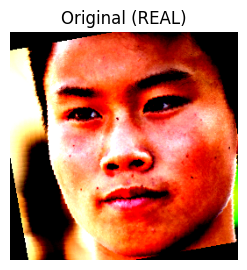

In [22]:
for i, elem in enumerate(train_dataloader):
    if(i==1):
        break

    with torch.no_grad():
        orig_img = elem["image"][0]
        orig_img = orig_img.permute(1,2,0).squeeze(0)
        plt.figure(figsize=(10, 3))
        plt.subplot(1, 3, 1)
        target = "FAKE" if elem["label"][0] == 1 else "REAL"
        plt.title(f"Original ({target})")
        plt.imshow(orig_img)
        plt.axis("off")


In [21]:
# Freeze all parameters
for param in normal_model.parameters():
    param.requires_grad = True

"""# Unfreeze selected final layers
for layer_name in ['conv_head', 'bn2', 'global_pool', 'classifier']:
    layer = getattr(normal_model, layer_name)
    for param in layer.parameters():
        param.requires_grad = True"""


for param in robust_model.parameters():
    param.requires_grad = True

In [22]:
optimizer = torch.optim.Adam(normal_model.parameters(), 0.0001, weight_decay=0.0001)


In [49]:
train(model=robust_model,
      train_loader=train_dataloader,
      test_loader = test_dataloader,
      optimizer=optimizer,
      device=device,
      epochs=1)

Epoch 1/1 - Training:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 1/1 - Training: 100%|██████████| 250/250 [00:22<00:00, 11.31it/s]


Epoch 1 - Train Loss: 2.1217 | Train Acc: 54.71%


Epoch 1/1 - Evaluating: 100%|██████████| 63/63 [00:01<00:00, 33.68it/s]

Epoch 1 - Eval Loss: 1.6241 | Eval Acc: 58.50%



Training the model with pmi defined on paper

In [24]:
def evaluate_model(model, test_dataloader, criterion, device):
    model.eval()
    correct = 0
    total = 0
    total_loss = 0.0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch in test_dataloader:
            images, labels = batch["image"].to(device), batch["label"].to(device)
            logits = model(images) # adjust if not split
            loss = criterion(logits, labels)
            total_loss += loss.item()

            preds = torch.argmax(logits, dim=1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            correct += (preds == labels).sum().item()
            total += labels.size(0)

    accuracy = 100.0 * correct / total
    avg_loss = total_loss / len(test_dataloader)
    f1 = f1_score(all_labels, all_preds, average="macro")  # or "weighted" or "micro" depending on your use case

    return avg_loss, accuracy, f1


In [25]:
# Training loop with PMI
def train_with_pmi(model, train_dataloader, eval_loader, optimizer, loss_ce, device, num_epochs=5, alpha=0.1, r=0.1, patience = 5):
    model.to(device)

    counter = 0
    best_f1 = 0.0
    best_model = None

    for epoch in range(num_epochs):
        model.train()
        epoch_perturbed_loss = 0.0
        epoch_clean_loss = 0.0

        for batch in tqdm(train_dataloader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            images, labels = batch["image"].to(device), batch["label"].to(device)


            optimizer.zero_grad()
            # First forward step
            shallow = model.shallow
            shallow_layers = [shallow.shallow1, shallow.shallow2, shallow.shallow3, shallow.shallow4, shallow.shallow5]

            dmus = [0 for i in range(len(shallow_layers))]
            dsigmas = [0 for i in range(len(shallow_layers))]

            means = [0 for i in range(len(shallow_layers))]
            stds = [0 for i in range(len(shallow_layers))]

            f_primes = [0 for i in range(len(shallow_layers))]


            for i, layer in enumerate(shallow_layers):
                if i == 0:
                    # normal forward for first shallow layer on input images
                    feature = layer(images)
                else:
                    # feed perturbed feature from previous layer for subsequent shallow layers
                    feature = layer(f_primes[i-1])

                # Calculate Means and Stds
                means[i] = torch.mean(feature, [2,3], keepdim=True)
                means[i].retain_grad()

                stds[i] = torch.std(feature, [2,3], keepdim=True)
                stds[i].retain_grad()

                f_primes[i] = calculate_f_prime(feature, means[i], stds[i], dmus[i], dsigmas[i])
                feature.retain_grad()

            deep = model.deep
            logits = deep(f_primes[-1])

            loss = loss_ce(logits, labels)
            epoch_clean_loss+=loss.item()

            loss.backward(retain_graph=True)
            # At this point we should have access to gradient wrt mu and sigma
            grads_g1 = [p.grad.clone() for p in shallow.parameters()]

            optimizer.zero_grad()
            for i in range(len(shallow_layers)):
                dmu, dsigma = calculate_deltas(means[i].grad, stds[i].grad, r)
                dmus[i] = dmu.detach()
                dsigmas[i] = dsigma.detach()



            for i, layer in enumerate(shallow_layers):
                f_primes[i] = calculate_f_prime(f_primes[i].detach(), means[i], stds[i], dmus[i], dsigmas[i])


            logits_perturbed = deep(f_primes[-1])

            # Losses
            loss_perturbed = loss_ce(logits_perturbed, labels)
            epoch_perturbed_loss+=loss_perturbed.item()
            loss_perturbed.backward()

            grads_g2 = [p.grad.clone() for p in shallow.parameters()]

            loss_clean = loss

            for p, g1, g2 in zip(shallow.parameters(), grads_g1, grads_g2):
                p.grad = (1 - alpha) * g1 + alpha * g2

            optimizer.step()
            del loss, loss_clean, loss_perturbed, logits, logits_perturbed


        avg_perturbed_loss = epoch_perturbed_loss / len(train_dataloader)
        avg_clean_loss = epoch_clean_loss / len(train_dataloader)
        test_loss, test_accuracy, test_f1 = evaluate_model(model, eval_loader, loss_ce, device)

        print(
            f"Epoch {epoch+1}/{num_epochs} | "
            f"Train Clean Loss: {avg_clean_loss:.4f} | "
            f"Train Perturbed Loss: {avg_perturbed_loss:.4f} | "
            f"Test Loss: {test_loss:.4f} | "
            f"Test Accuracy: {test_accuracy:.2f}% | "
            f"Test F1: {test_f1:.4f}"
)
        if(test_f1>best_f1):
            best_model = model.state_dict()
            counter = 0
            best_f1 = test_f1
        else:
            counter+=1
            if(counter>=patience):
                print("Early stopping triggered...")
                break



    return model.load_state_dict(best_model)


Evaluating with FGSM (epsilon = 0)


  0%|          | 0/63 [00:00<?, ?it/s]

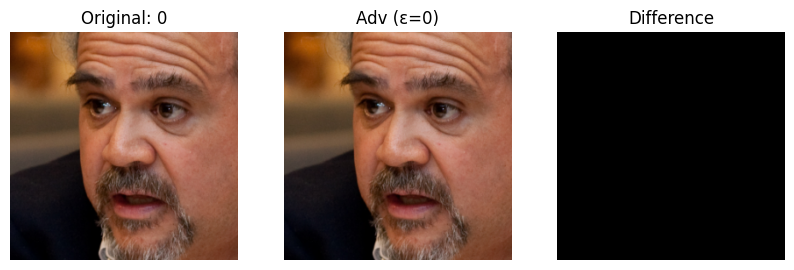

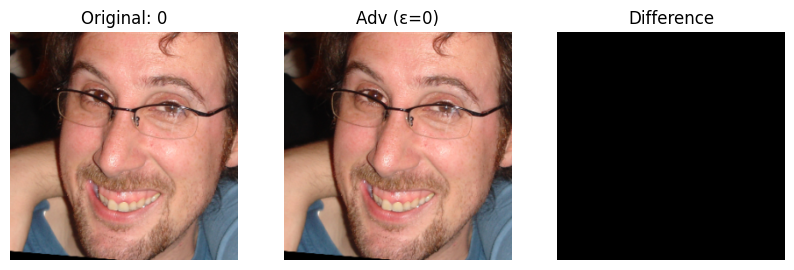

100%|██████████| 63/63 [00:06<00:00,  9.02it/s]



Classification Report on Adversarial Data (epsilon = 0):
              precision    recall  f1-score   support

           0     0.8219    0.9920    0.8990      1000
           1     0.9899    0.7850    0.8756      1000

    accuracy                         0.8885      2000
   macro avg     0.9059    0.8885    0.8873      2000
weighted avg     0.9059    0.8885    0.8873      2000


Confusion Matrix on Adversarial Data:
[[992   8]
 [215 785]]

Evaluating with FGSM (epsilon = 0.01)


  0%|          | 0/63 [00:00<?, ?it/s]

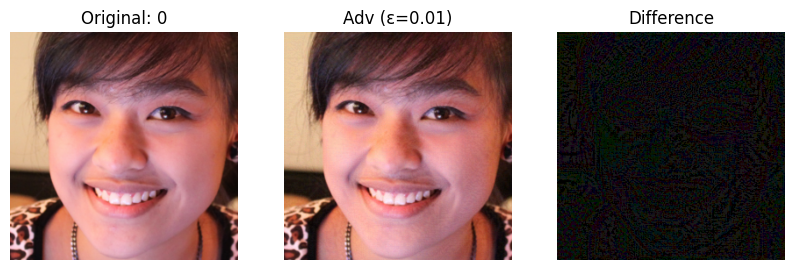

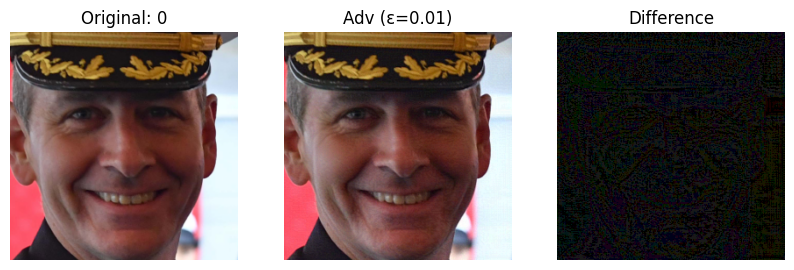

100%|██████████| 63/63 [00:06<00:00,  9.19it/s]



Classification Report on Adversarial Data (epsilon = 0.01):
              precision    recall  f1-score   support

           0     0.4641    0.6650    0.5467      1000
           1     0.4092    0.2320    0.2961      1000

    accuracy                         0.4485      2000
   macro avg     0.4366    0.4485    0.4214      2000
weighted avg     0.4366    0.4485    0.4214      2000


Confusion Matrix on Adversarial Data:
[[665 335]
 [768 232]]

Evaluating with FGSM (epsilon = 0.1)


  0%|          | 0/63 [00:00<?, ?it/s]

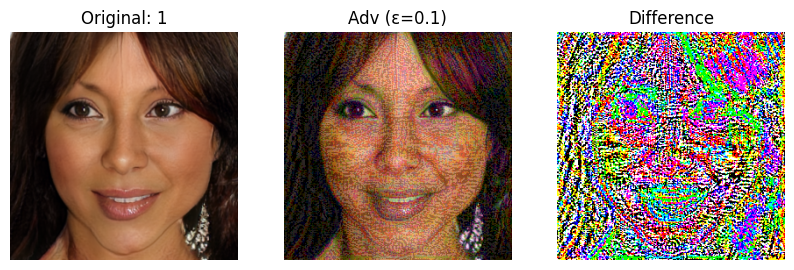

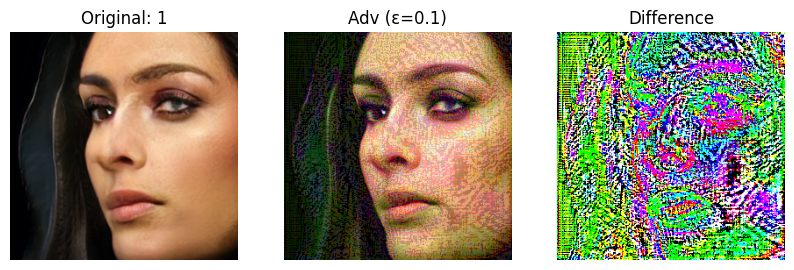

100%|██████████| 63/63 [00:06<00:00,  9.41it/s]
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this 


Classification Report on Adversarial Data (epsilon = 0.1):
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667      1000
           1     0.0000    0.0000    0.0000      1000

    accuracy                         0.5000      2000
   macro avg     0.2500    0.5000    0.3333      2000
weighted avg     0.2500    0.5000    0.3333      2000


Confusion Matrix on Adversarial Data:
[[1000    0]
 [1000    0]]

Evaluating with FGSM (epsilon = 0.3)


  0%|          | 0/63 [00:00<?, ?it/s]

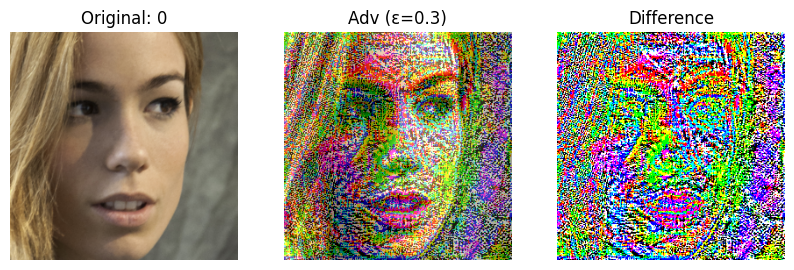

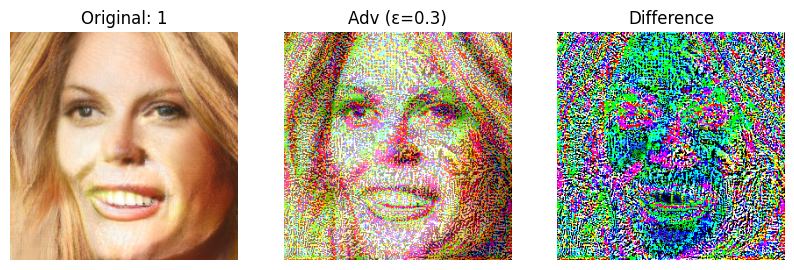

100%|██████████| 63/63 [00:06<00:00,  9.27it/s]


Classification Report on Adversarial Data (epsilon = 0.3):
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667      1000
           1     0.0000    0.0000    0.0000      1000

    accuracy                         0.5000      2000
   macro avg     0.2500    0.5000    0.3333      2000
weighted avg     0.2500    0.5000    0.3333      2000


Confusion Matrix on Adversarial Data:
[[1000    0]
 [1000    0]]



/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

In [50]:
epsilons = [0, 0.01, 0.1, 0.3]
accuracies = []

for eps in epsilons:
    print(f"\nEvaluating with FGSM (epsilon = {eps})")
    acc = evaluate_fgsm(
        model=normal_model,              # modello NON addestrato con FGSM
        dataloader=test_dataloader,          # dataloader dei dati CLEAN (non attaccati)
        device=device,
        epsilon=eps,
        visualize=True,                  # opzionale, disattiva se non ti serve
        num_visualize=2                  # quante immagini mostrare per epsilon
    )
    accuracies.append(acc)

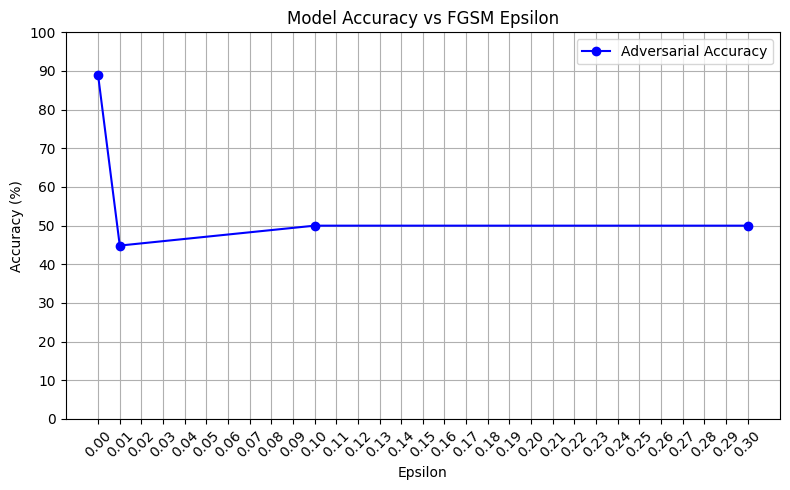

In [51]:
plot_accuracies(accuracies=accuracies, epsilons=epsilons)

Adversiarial train

In [42]:
def train_adversarial(model, train_loader, test_loader, optimizer, device, epochs=1, epsilon=0.01):
    import torch.nn.functional as F
    from tqdm import tqdm

    model.to(device)
    model.train()

    # Costanti di normalizzazione (ImageNet)
    MEAN = [0.485, 0.456, 0.406]
    STD = [0.229, 0.224, 0.225]
    mean_tensor = torch.tensor(MEAN).to(device).view(1, 3, 1, 1)
    std_tensor = torch.tensor(STD).to(device).view(1, 3, 1, 1)

    for epoch in range(epochs):
        total_loss = 0.0

        for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            images = batch["image"].to(device)
            labels = batch["label"].to(device)

            # 1. Forward + gradient computation on clean images
            images.requires_grad = True
            outputs = model(images)
            loss = F.cross_entropy(outputs, labels)

            optimizer.zero_grad()
            loss.backward()

            # 2. Denormalize
            x_denorm = denormalize(images, MEAN, STD, device)

            # 3. FGSM perturbation on denormalized images
            grad = images.grad.data
            x_adv = torch.clamp(x_denorm + epsilon * grad.sign(), 0, 1)

            # 4. Renormalize
            x_adv = (x_adv - mean_tensor) / std_tensor
            x_adv = x_adv.detach()

            # 5. Forward + backward on adversarial images
            adv_outputs = model(x_adv)
            adv_loss = F.cross_entropy(adv_outputs, labels)

            optimizer.zero_grad()
            adv_loss.backward()
            optimizer.step()

            total_loss += adv_loss.item()


        avg_train_loss = total_loss / len(train_dataloader)
        test_loss, test_accuracy, test_f1 = evaluate_model(model, test_dataloader, loss_ce, device)

        print(
            f"Epoch {epoch+1}/{epochs} | "
            f"Train Loss: {avg_train_loss:.4f} | "
            f"Test Loss: {test_loss:.4f} | "
            f"Test Accuracy: {test_accuracy:.2f}% | "
            f"Test F1: {test_f1:.4f}"
)


In [40]:
# Genera il dataset aumentato
augmented_dataset = AdversarialDataset(model=normal_model, base_dataset=train_dataset, device=device, adv_prob=0.5, mean=MEAN, std=STD, epsilon_range=(0.0001, 0.5), distribution="uniform")
augmented_dataloader = DataLoader(augmented_dataset, batch_size=32, shuffle=True, collate_fn=train_dataset.collate_fn)

In [43]:
optimizer = torch.optim.Adam(normal_model.parameters(), 0.0001, weight_decay=0.0001)

train_adversarial(
    model=normal_model,
    train_loader=train_dataloader,
    test_loader=validation_dataloader,
    optimizer=optimizer,
    device=device,
    epochs=10,
    epsilon=0.001  # oppure 0.01
)


Epoch 1/10: 100%|██████████| 250/250 [00:41<00:00,  6.04it/s]


Epoch 1/10 | Train Loss: 0.5729 | Test Loss: 0.3614 | Test Accuracy: 86.70% | Test F1: 0.8648


Epoch 2/10: 100%|██████████| 250/250 [00:39<00:00,  6.33it/s]


Epoch 2/10 | Train Loss: 0.5635 | Test Loss: 0.3810 | Test Accuracy: 84.05% | Test F1: 0.8370


Epoch 3/10: 100%|██████████| 250/250 [00:39<00:00,  6.30it/s]


Epoch 3/10 | Train Loss: 0.4636 | Test Loss: 0.3400 | Test Accuracy: 85.40% | Test F1: 0.8512


Epoch 4/10: 100%|██████████| 250/250 [00:39<00:00,  6.29it/s]


Epoch 4/10 | Train Loss: 0.4216 | Test Loss: 0.3152 | Test Accuracy: 86.70% | Test F1: 0.8651


Epoch 5/10: 100%|██████████| 250/250 [00:39<00:00,  6.26it/s]


Epoch 5/10 | Train Loss: 0.4137 | Test Loss: 0.2850 | Test Accuracy: 88.60% | Test F1: 0.8847


Epoch 6/10: 100%|██████████| 250/250 [00:39<00:00,  6.31it/s]


Epoch 6/10 | Train Loss: 0.3596 | Test Loss: 0.2687 | Test Accuracy: 90.25% | Test F1: 0.9020


Epoch 7/10: 100%|██████████| 250/250 [00:39<00:00,  6.35it/s]


Epoch 7/10 | Train Loss: 0.3512 | Test Loss: 0.2738 | Test Accuracy: 90.70% | Test F1: 0.9067


Epoch 8/10: 100%|██████████| 250/250 [00:39<00:00,  6.28it/s]


Epoch 8/10 | Train Loss: 0.3273 | Test Loss: 0.2552 | Test Accuracy: 89.60% | Test F1: 0.8950


Epoch 9/10: 100%|██████████| 250/250 [00:39<00:00,  6.35it/s]


Epoch 9/10 | Train Loss: 0.3107 | Test Loss: 0.2416 | Test Accuracy: 91.35% | Test F1: 0.9134


Epoch 10/10: 100%|██████████| 250/250 [00:39<00:00,  6.25it/s]


Epoch 10/10 | Train Loss: 0.2867 | Test Loss: 0.2804 | Test Accuracy: 88.85% | Test F1: 0.8873


# Test

Test and report for the base model

In [44]:
def report(model, test_loader, loss):
    from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
    import matplotlib.pyplot as plt
    model = model.to(device)
    model.eval()
    all_predictions = []
    all_targets = []

    total_loss = 0.0
    with torch.no_grad():
      for batch in tqdm(test_loader):
        input, target = batch["image"], batch["label"]

        input = input.to(device)
        target = target.to(device)

        output = model(input)

        l = loss(output, target)
        total_loss += l.item()

        # Get predictions
        preds = torch.argmax(output, dim=1)  # Adjust if it's binary or multilabel

        all_predictions.extend(preds.cpu().numpy())
        all_targets.extend(target.cpu().numpy())

    # Print classification report
    print("\nClassification Report:")
    print(classification_report(all_targets, all_predictions, digits=4))  # Adjust labels if needed

    # Plot confusion matrix
    label_names = ["REAL", "FAKE"]

    cm = confusion_matrix(all_targets, all_predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_names)
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()

100%|██████████| 63/63 [00:01<00:00, 35.13it/s]



Classification Report:
              precision    recall  f1-score   support

           0     0.8609    0.9720    0.9131      1000
           1     0.9679    0.8430    0.9011      1000

    accuracy                         0.9075      2000
   macro avg     0.9144    0.9075    0.9071      2000
weighted avg     0.9144    0.9075    0.9071      2000



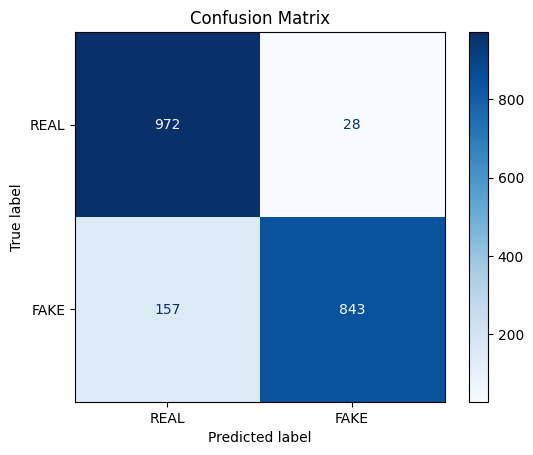

In [34]:
report(normal_model, validation_dataloader, loss_ce)

**risultati baseline pgd,deepfool e i-fsgm**

  0%|          | 0/63 [00:00<?, ?it/s]

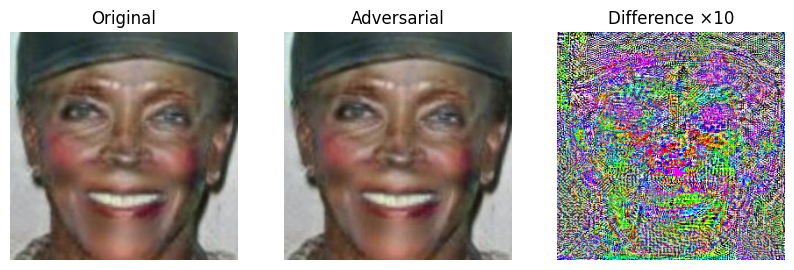

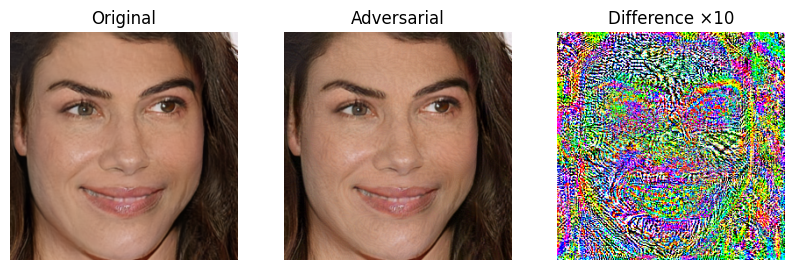

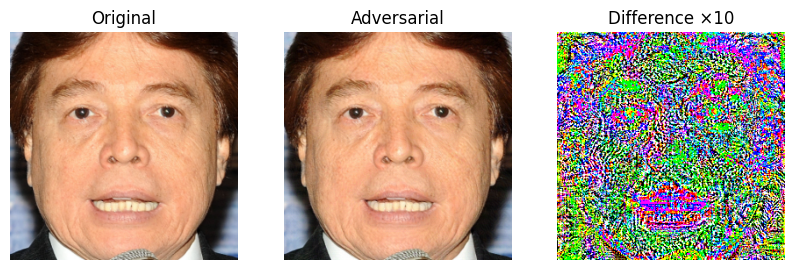

100%|██████████| 63/63 [00:36<00:00,  1.71it/s]



Accuracy after PGD Attack (ε=0.01): 1.30%

Classification Report:
              precision    recall  f1-score   support

           0     0.0091    0.0090    0.0090      1000
           1     0.0169    0.0170    0.0169      1000

    accuracy                         0.0130      2000
   macro avg     0.0130    0.0130    0.0130      2000
weighted avg     0.0130    0.0130    0.0130      2000


Confusion Matrix:
[[  9 991]
 [983  17]]


  0%|          | 0/63 [00:00<?, ?it/s]

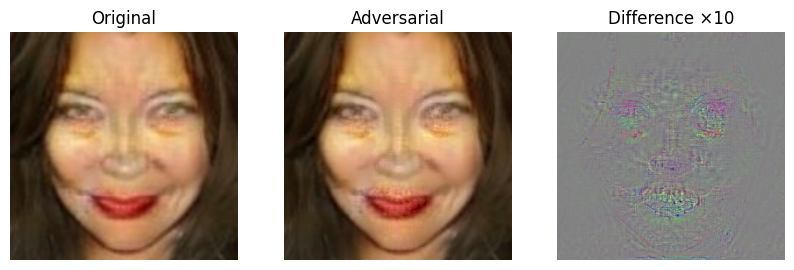

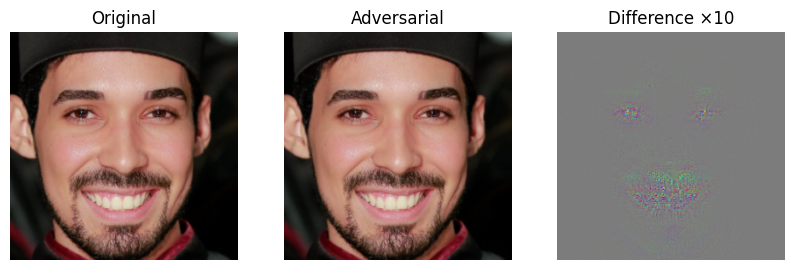

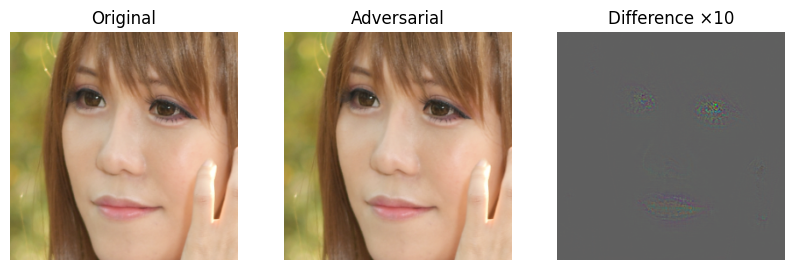

100%|██████████| 63/63 [00:54<00:00,  1.15it/s]



Accuracy after DeepFool Attack: 29.10%

Classification Report:
              precision    recall  f1-score   support

           0     0.1640    0.1020    0.1258      1000
           1     0.3483    0.4800    0.4037      1000

    accuracy                         0.2910      2000
   macro avg     0.2562    0.2910    0.2647      2000
weighted avg     0.2562    0.2910    0.2647      2000


Confusion Matrix:
[[102 898]
 [520 480]]


  0%|          | 0/63 [00:00<?, ?it/s]

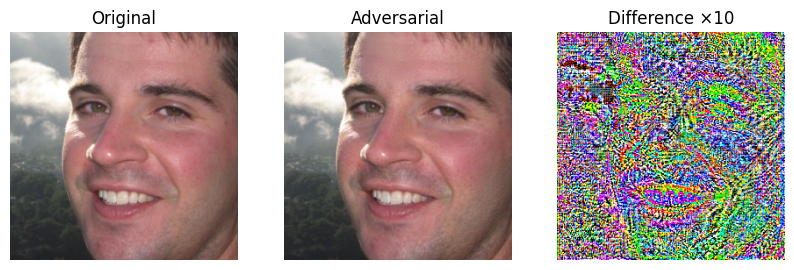

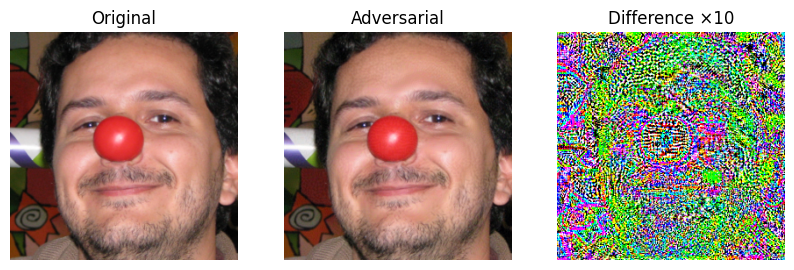

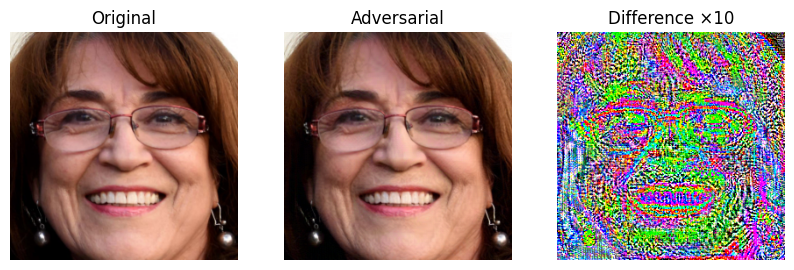

100%|██████████| 63/63 [00:48<00:00,  1.30it/s]


Accuracy after I-FGSM Attack (ε=0.01, α=0.001, steps=10): 6.30%

Classification Report:
              precision    recall  f1-score   support

           0     0.0390    0.0370    0.0380      1000
           1     0.0846    0.0890    0.0867      1000

    accuracy                         0.0630      2000
   macro avg     0.0618    0.0630    0.0624      2000
weighted avg     0.0618    0.0630    0.0624      2000


Confusion Matrix:
[[ 37 963]
 [911  89]]


In [39]:
evaluate_pgd(normal_model, validation_dataloader, device, epsilon=0.01, alpha=0.005, steps=10)
evaluate_deepfool(normal_model, validation_dataloader, device, num_classes=2)
evaluate_i_fgsm(model=normal_model, dataloader=validation_dataloader, device=device, epsilon=0.01, alpha=0.001, iters=10)



Evaluating with FGSM (epsilon = 0)


  0%|          | 0/63 [00:00<?, ?it/s]

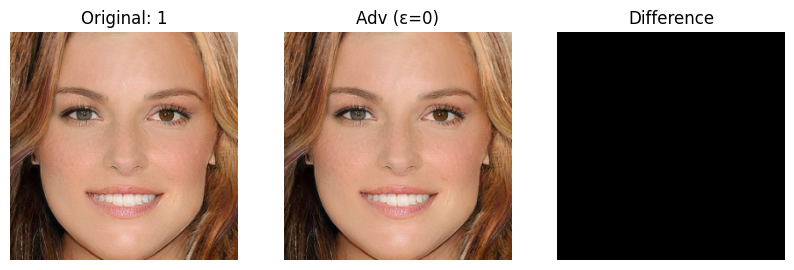

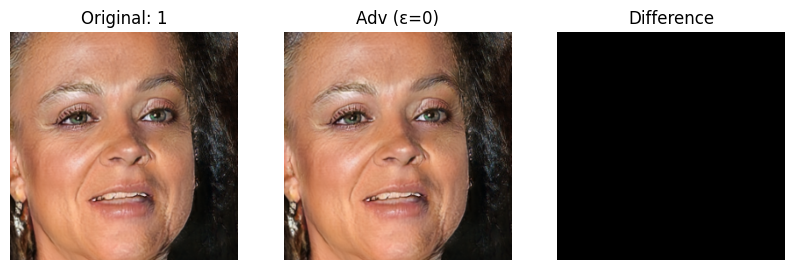

100%|██████████| 63/63 [00:07<00:00,  8.91it/s]



Classification Report on Adversarial Data (epsilon = 0):
              precision    recall  f1-score   support

           0     0.8219    0.9920    0.8990      1000
           1     0.9899    0.7850    0.8756      1000

    accuracy                         0.8885      2000
   macro avg     0.9059    0.8885    0.8873      2000
weighted avg     0.9059    0.8885    0.8873      2000


Confusion Matrix on Adversarial Data:
[[992   8]
 [215 785]]

Evaluating with FGSM (epsilon = 0.01)


  0%|          | 0/63 [00:00<?, ?it/s]

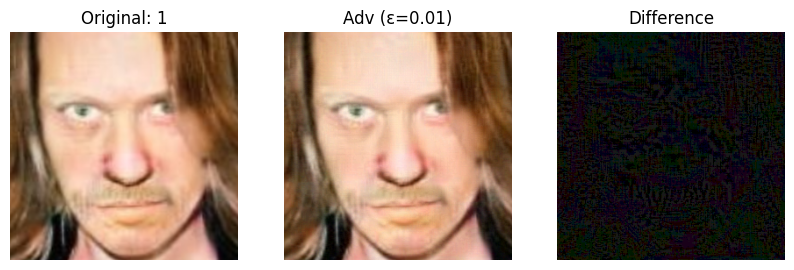

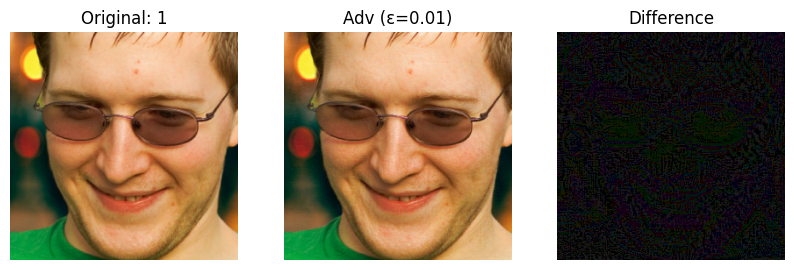

100%|██████████| 63/63 [00:07<00:00,  8.91it/s]



Classification Report on Adversarial Data (epsilon = 0.01):
              precision    recall  f1-score   support

           0     0.4641    0.6650    0.5467      1000
           1     0.4092    0.2320    0.2961      1000

    accuracy                         0.4485      2000
   macro avg     0.4366    0.4485    0.4214      2000
weighted avg     0.4366    0.4485    0.4214      2000


Confusion Matrix on Adversarial Data:
[[665 335]
 [768 232]]

Evaluating with FGSM (epsilon = 0.1)


  0%|          | 0/63 [00:00<?, ?it/s]

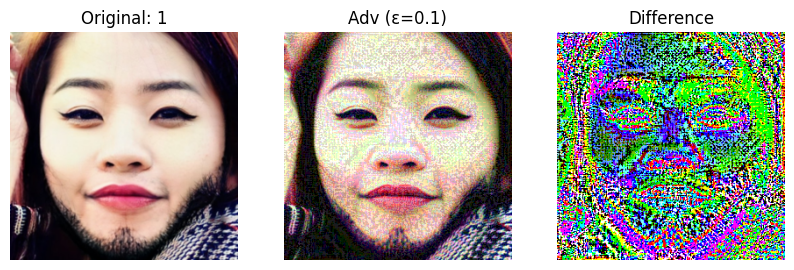

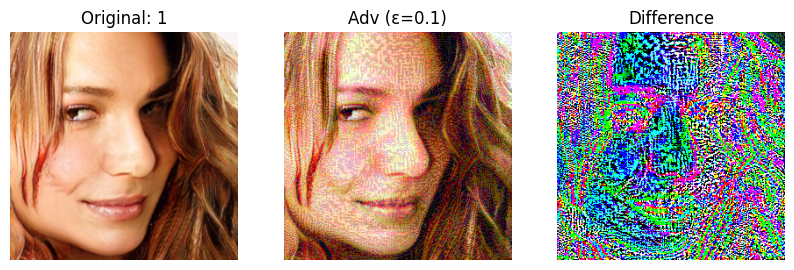

100%|██████████| 63/63 [00:07<00:00,  8.92it/s]
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this 


Classification Report on Adversarial Data (epsilon = 0.1):
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667      1000
           1     0.0000    0.0000    0.0000      1000

    accuracy                         0.5000      2000
   macro avg     0.2500    0.5000    0.3333      2000
weighted avg     0.2500    0.5000    0.3333      2000


Confusion Matrix on Adversarial Data:
[[1000    0]
 [1000    0]]

Evaluating with FGSM (epsilon = 0.3)


  0%|          | 0/63 [00:00<?, ?it/s]

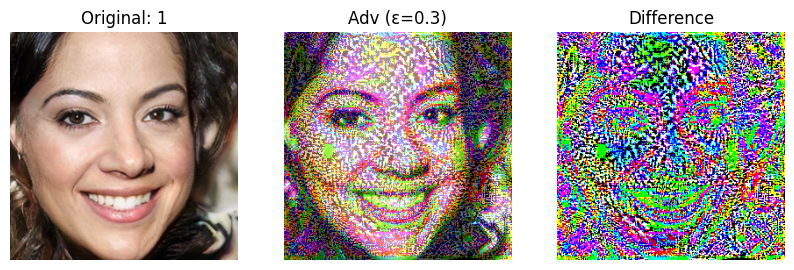

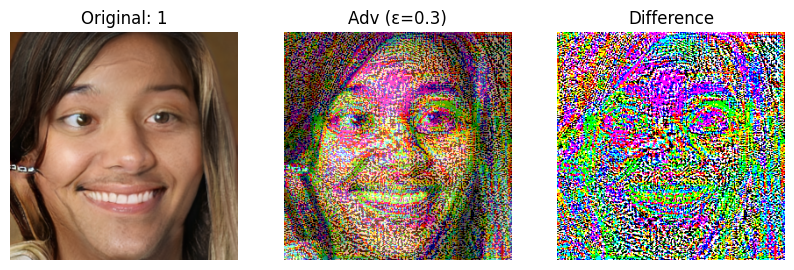

100%|██████████| 63/63 [00:07<00:00,  8.66it/s]


Classification Report on Adversarial Data (epsilon = 0.3):
              precision    recall  f1-score   support

           0     0.5000    1.0000    0.6667      1000
           1     0.0000    0.0000    0.0000      1000

    accuracy                         0.5000      2000
   macro avg     0.2500    0.5000    0.3333      2000
weighted avg     0.2500    0.5000    0.3333      2000


Confusion Matrix on Adversarial Data:
[[1000    0]
 [1000    0]]



/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/flaviolinux/machine_learning_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{met

In [45]:
epsilons = [0, 0.01, 0.1, 0.3]
accuracies = []

for eps in epsilons:
    print(f"\nEvaluating with FGSM (epsilon = {eps})")
    acc = evaluate_fgsm(
        model=normal_model,              # modello NON addestrato con FGSM
        dataloader=test_dataloader,          # dataloader dei dati CLEAN (non attaccati)
        device=device,
        epsilon=eps,
        visualize=True,                  # opzionale, disattiva se non ti serve
        num_visualize=2                  # quante immagini mostrare per epsilon
    )
    accuracies.append(acc)


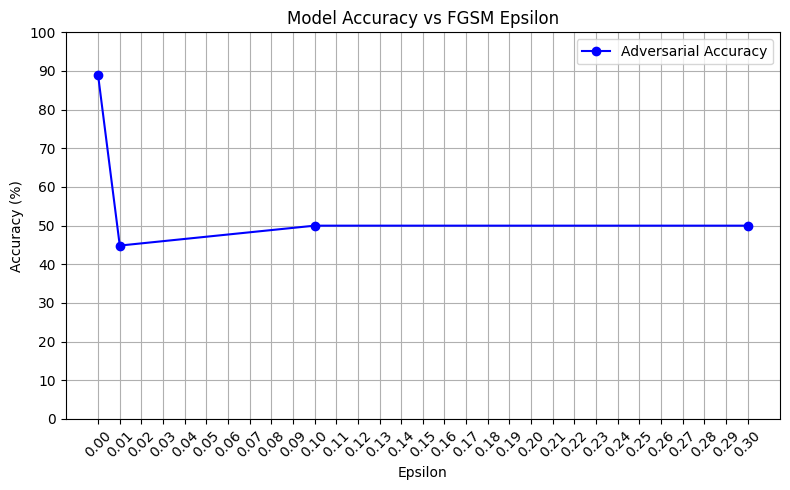

In [46]:
plot_accuracies(accuracies=accuracies, epsilons=epsilons)

In [ ]:
optimizer = torch.optim.Adam(normal_model.parameters(), lr=1e-3)
train(model=normal_model,
      train_loader=augmented_dataloader,
      test_loader=validation_dataloader,
      optimizer=optimizer,
      device=device,
      epochs=2)


Testing with Fsgm attack

In [ ]:
epsilons = [0, 0.0001, 0.001, 0.01, 0.1]
accuracies = []

for eps in epsilons:
    print(f"\nEvaluating with FGSM (epsilon = {eps})")
    acc = evaluate_fgsm(
        model=normal_model,
        dataloader=test_dataloader,
        device=device,
        epsilon=eps,
        visualize=True,
        num_visualize=2
    )
    accuracies.append(acc)

plot_accuracies(accuracies=accuracies, epsilons = epsilons)

Regularization implementation (from paper)

In [ ]:
from gc import collect
torch.cuda.empty_cache()
collect()

In [ ]:
torch.cuda.empty_cache()
#del normal_model
#del eff_model
collect()

In [ ]:
eff_model = EfficientNet(robust_model)

# Example: Only unfreeze shallow layers
for param in eff_model.shallow.parameters():
    param.requires_grad = True

# Freeze deeper layers if desired
for param in eff_model.deep.parameters():
    param.requires_grad = False


loss = nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(eff_model.parameters(), lr=0.01, weight_decay=1e-4)
device = "cuda" if torch.cuda.is_available() else "cpu"
alpha = 0.6
trained_model = train_with_pmi(eff_model,
                               train_dataloader,
                               test_dataloader,
                               optimizer,
                               loss,
                               device,
                               num_epochs=3,
                               alpha=alpha,
                               r=0.1)

In [ ]:
epsilons = [0, 0.0001, 0.001, 0.01]
accuracies = []

for eps in epsilons:
    print(f"\nEvaluating with FGSM (epsilon = {eps})")
    acc = evaluate_fgsm(
        model=robust_model,
        dataloader=test_dataloader,
        device=device,
        epsilon=eps,
        visualize=True,
        num_visualize=2
    )
    accuracies.append(acc)

plot_accuracies(accuracies=accuracies, epsilons = epsilons)

**TEST SUL MODELLO RINFORZATO DA ADVERSARIAL TRAINING**

In [ ]:
evaluate_fgsm(model=normal_model, dataloader=test_dataloader, device=device, epsilon=0.001)


In [ ]:
evaluate_fgsm(model=normal_model, dataloader=test_dataloader, device=device, epsilon=0.01)


In [ ]:
evaluate_fgsm(model=normal_model, dataloader=test_dataloader, device=device, epsilon=0.0001)


In [ ]:
evaluate_pgd(normal_model, validation_dataloader, device, epsilon=0.001, alpha=0.005, steps=10)

In [ ]:
evaluate_deepfool(normal_model, validation_dataloader, device, num_classes=2)

In [ ]:
# Test con I-FGSM sul modello robusto
evaluate_i_fgsm(
    model=normal_model,
    dataloader=validation_dataloader,
    device=device,
    epsilon=0.01,
    alpha=0.001,
    iters=10
)
